<a href="https://colab.research.google.com/github/pmckim1/Capstone/blob/main/Syrian_case_study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install packages for googl colab 
!pip install chart_studio
!pip install fuzzywuzzy


!pip uninstall -y plotly
!pip install plotly>=4.9
import plotly
import plotly.graph_objects as go
!pip freeze

In [ ]:
# use high-ram to speed up processing on collab 
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.7 gigabytes of available RAM

To enable a high-RAM runtime, select the Runtime > "Change runtime type"
menu, and then select High-RAM in the Runtime shape dropdown. Then, 
re-execute this cell.


In [ ]:
import numpy as np
np.random.seed(42)
from google.colab import drive
import json 
import sys
import pandas as pd
import datetime as dt
import warnings
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import string
import chart_studio
import chart_studio.plotly as py
import chart_studio.tools as tls
import plotly.express as px
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
# Mount Google Drive
drive.mount('/content/drive')

# plotly chart
user_name="reivax"
apikey="GnUUtgxwvhZ4rQbiIUTd"

chart_studio.tools.set_credentials_file(username=user_name, api_key=apikey)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

# Get the absolute path of the current folder
abspath_curr = '/content/drive/My Drive/capstone/capstone/Data/Guardian/'

# load in all the file output from event extraction algo 

df = pd.read_csv(abspath_curr +'stream-topped-2.csv', header=0)
#df=df.drop(["Unnamed: 0"], axis=1)
df2 = pd.read_csv(abspath_curr +'stream-topped-1.csv', header=0)
df3=pd.read_csv(abspath_curr +'stream-topped_5_to_9_third.csv', header=0)

# data aggregation and clean up 
df=pd.concat([df, df2], axis=0)
df=pd.concat([df, df3], axis=0)
print(len(df))
df=df.drop(["Unnamed: 0", "timeset"], axis=1)

# function to see what is missing 
def missing_values_table(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(
    columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
    '% of Total Values', ascending=False).round(1)
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
        "There are " + str(mis_val_table_ren_columns.shape[0]) +
            " columns that have missing values.")
    return mis_val_table_ren_columns

missing_values_table(df)

# drop minimal missing data
df=df.dropna()

# take new cluster count numbers to get only narratives that have 5+ articles post processing 
df['cluster_counts_new'] = df.groupby('v_hier_infomap_comm')['v_hier_infomap_comm'].transform('count')

# make new dataframe to speed up sitution 
df=df[['top_who_answer', 'top_what_answer',
       'top_when_answer', 'top_where_answer', 'top_why_answer',
       'top_how_answer', "pub_date_dto", "headline", "v_hier_infomap_comm", 'cluster_counts_new', "cluster_counts", "text_ents_label", "text_ents"]]
# we only want to look at narrative chains with more than 5 processed articles        
df = df[df['cluster_counts_new'] >= 5]
print(len(df))


19949
Your selected dataframe has 30 columns.
There are 13 columns that have missing values.
17685


In [ ]:
missing_values_table(df)

Your selected dataframe has 13 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [ ]:
# named entity Clean up 
# filtering based on the named entities we are interested in 
def extract_names(row):
  text_ents_labels = row['text_ents_label']
  text_ents = row['text_ents']
  # print(text_ents_labels)
  # print(text_ents)

  entity_ret = []
  entity_type_ret = []

  text_ents_labels_list = []
  text_ents_labels_list = json.loads(text_ents_labels.replace('\'', '"'))
  # print(text_ents_labels_list)
  # print(json.dumps(text_ents_labels_list))

  text_ents_list = text_ents.split('], [')
  text_ents_list[0] = text_ents_list[0][2:]
  text_ents_list[-1] = text_ents_list[-1][:-2]
  # print(text_ents_list)
  # print(json.dumps(text_ents_list))

  for label, entity in zip(text_ents_labels_list, text_ents_list):
    # print("entity, label", entity, label)
    if label in ["PERSON", "NORP", "ORG", "GPE", "LOC", "EVENT"]:
      entity_ret.append(entity)
      entity_type_ret.append(label)
  return pd.Series([entity_ret, entity_type_ret])

df[['entity', 'entity_type']] = df.apply(lambda row: extract_names(row), axis=1)


In [ ]:
#Reshape data for NER 
# new_df = pd.DataFrame(columns=['headline', 'pub_date_dto', 'entity', 'entity_type'])

rows_list = []
for index, row in df.iterrows():
    new_row = {
        'headline': row['headline'],
        'pub_date_dto': row['pub_date_dto'],
        'v_hier_infomap_comm': row['v_hier_infomap_comm']
    }
    for entity, entity_type in zip(row['entity'], row['entity_type']):
      new_row['entity'] = entity
      new_row['entity_type'] = entity_type

      # new_df.append(new_row, ignore_index=True)
      rows_list.append(new_row.copy())

new_df = pd.DataFrame(rows_list) 

In [ ]:
# number of article chains we can analyze 
number_of_narrative_chains= df.v_hier_infomap_comm.value_counts()

print("Number of Article Chains Remaining:")
print(len(number_of_narrative_chains))

print("Total Amount of Articles in Dataset")
print(len(df))

Number of Article Chains Remaining:
2067
Total Amount of Articles in Dataset
17685


In [ ]:
# lowercase everything & clean up GiveME51H output

df=df.apply(lambda x: x.astype(str).str.lower() if(x.dtype == 'object') else x)

df["top_who_answer"]=df['top_who_answer'].str.lower()
df["top_what_answer"]=df['top_what_answer'].str.lower()
df["top_when_answer"]=df['top_when_answer'].str.lower()
df["top_where_answer"]=df['top_where_answer'].str.lower()
df["top_why_answer"]=df['top_why_answer'].str.lower()
df["top_how_answer"]=df['top_how_answer'].str.lower()


# Define the function to remove the punctuation
def remove_punctuations(text):
    for punctuation in string.punctuation:
        text = text.replace(punctuation, '')
    return text
# Apply to the DF series
df['top_who_answer'] = df['top_who_answer'].apply(remove_punctuations)
df['top_what_answer'] = df['top_what_answer'].apply(remove_punctuations)
df['top_when_answer'] = df['top_when_answer'].apply(remove_punctuations)
df['top_where_answer'] = df['top_where_answer'].apply(remove_punctuations)
df['top_why_answer'] = df['top_why_answer'].apply(remove_punctuations)
df['top_how_answer'] = df['top_how_answer'].apply(remove_punctuations)

'''
df['top_who_answer'] = df['top_who_answer'].str.replace('they','')
df['top_who_answer'] = df['top_who_answer'].str.replace('I','')
df['top_why_answer'] = df['top_why_answer'].str.replace('they','')
'''
df['top_who_answer'] = df['top_who_answer'].str.replace(' ',' ')
df['top_who_answer'] = df['top_who_answer'].str.replace('donald trump donald trump','donald trump')
df['top_who_answer'] = df['top_who_answer'].str.replace('trump','donald trump')
df['top_who_answer'] = df['top_who_answer'].str.replace('donald donald trump','donald trump')
df['top_where_answer'] = df['top_where_answer'].str.replace('us','united states')
df['top_where_answer'] = df['top_where_answer'].str.replace('uk','united kingdom')



In [ ]:
# set colors for network charts 
who_color="#00FF00"#bright green  
what_color="#0000FF" #royal Blue 
where_color="#339933" # forest green 
when_color="#ffff00" # yellow 
why_color="#ff3300" # orange  
how_color="#33ffff" # aqua 

# Random Number Generator Selected Cluster "22"

###Cluster 22 is about A Van Attack that took place in Barcelona and subsquent events; the community is made up of 36 articles 

In [ ]:
# we only want to look at articles from one cluster so filter 
df_barc=df[df['v_hier_infomap_comm'] == "3:1:1"] 

new_df=new_df[new_df['v_hier_infomap_comm'] == "3:1:1"] 

df_barc=df_barc[["pub_date_dto","headline",'top_who_answer', 'top_what_answer', 'top_when_answer',
       'top_where_answer', 'top_why_answer', 'top_how_answer']]

df_barc

,pub_date_dto,headline,top_who_answer,top_what_answer,top_when_answer,top_where_answer,top_why_answer,top_how_answer
1329,2018-04-08,‘most of them were going to die’: syria aid wo...,aid workers and local medics,have described apocalyptic scenes,saturday,douma,because it does n’t make a difference any more,and local medics have described apocalyptic sc...
1330,2018-04-08,syria will see us price for chemical attack as...,the us president,will opt for a discrete punishment,three days earlier,syria,donald trump ’s,the syrian mi8 helicopters are based is simpl...
1331,2018-04-08,trump: 'big price to pay' for syria chemical w...,donald trump,warned there,saturday,united states,there,“ big price to pay ” for a chemical strike
1332,2018-04-09,syria and russia accuse israel of missile atta...,spokesman,had no immediate comment,monday,syria,the russian military,israeli warplanes bombed a syrian regime airba...
1333,2018-04-09,syria gas attack: theresa may condemns 'barbar...,theresa may,has said the syrian president,sunday,britain,his russian backers,the prime minister did not rule out joining in...
...,...,...,...,...,...,...,...,...
1403,2018-04-18,chemical weapons inspectors' security team fir...,the opcw director general ahmet üzümcü,told a meeting,tuesday,syria,a un security team,the syrian town of douma has come under gunfire
1404,2018-04-18,'i don't get confused': nikki haley hits back ...,nikki haley the us ambassador to the united n...,hit back at claims by others in donald trump ’...,tuesday,runited statessia,she,impose fresh sanctions against russian compani...
1405,2018-04-20,last damascus rebels bombarded as assad presse...,president bashar alassad,moved to strengthen his position,wednesday,runited statessia,because a government airstrike had hit a rebel...,the syrian army has bombarded jihadis and othe...
1407,2018-04-24,syria: western nations seek to bypass russian ...,western nations,want to end the monthslong paralysis,10 days ago,syria,western nations,western nations want to end the monthslong par...


In [ ]:
# table/timeline of events from Event extraction 

fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_barc.columns),
                fill_color='lightgrey',
                align='left'),
    cells=dict(values=[df_barc.pub_date_dto, df_barc.headline , df_barc.top_who_answer, df_barc.top_what_answer, df_barc.top_when_answer, df_barc.top_where_answer, df_barc.top_why_answer, df_barc.top_how_answer],
               fill_color='whitesmoke',
               align='left'))
])

fig.show()
#py.plot(fig,filename="timeline",auto_open=False)

## Gant Graphical Representation of 5w1H features 

In [ ]:
# data frame to make gantt chart 
gantt_df = pd.DataFrame(columns=["who_name", "Begin", "End", "who_count"])
# print(df1.head(1))
for who_name in df_barc['top_who_answer'].unique().tolist():
  who_df = df_barc[df_barc["top_who_answer"] == who_name]
  who_count=len(who_df)

  every_publication_date = who_df["pub_date_dto"].unique().tolist()
  every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
  # if len(every_publication_date) < 2:
  #   continue
  min_pub_date_dto = min(every_publication_date_dto)
  max_pub_date_dto = max(every_publication_date_dto)
  max_pub_date_dto = max_pub_date_dto + dt.timedelta(days=1)

  cluster_dict = {
      'who_name': who_name,
      'Begin': min_pub_date_dto.strftime("%Y-%m-%d"),
      'End': max_pub_date_dto.strftime("%Y-%m-%d"),
      'who_count': who_count
  }
  # print(cluster_dict)
  gantt_df = gantt_df.append(cluster_dict, ignore_index=True)


In [ ]:
'''
#clean up chart 
import fuzzywuzzy
from fuzzywuzzy import fuzz
from fuzzywuzzy import process

fuzzy_gantt = gantt_df.copy()

matches=process.extract(fuzzy_gantt["who_name"][0], fuzzy_gantt["who_name"], scorer=fuzz.token_sort_ratio)
print(matches)
for match in matches:
  # Check whether the similarity score is greater than or equal to 55
  if match[1] >= 45:
    #print("Replacing {} with {}".format(match[0], 'younes abouyaaqoub'))
    # Select all rows where the cuisine_type is spelled this way, and set them to the correct cuisine
    print(fuzzy_gantt.loc[fuzzy_gantt['who_name'] == match[0]])
    fuzzy_gantt.loc[fuzzy_gantt['who_name'] == match[0], "who_name"] = 'fuzzy_gantt["who_name"][0]'
matches=process.extract("oukabir", fuzzy_gantt["who_name"], scorer=fuzz.token_sort_ratio)
print(matches)
for match in matches:
  # Check whether the similarity score is greater than or equal to 55
  if match[1] >= 55:
    # Select all rows where the cuisine_type is spelled this way, and set them to the correct cuisine
    fuzzy_gantt.loc[fuzzy_gantt['who_name'] == match[0], "who_name"] = 'driss oukabir'

 '''

'\n#clean up chart \nimport fuzzywuzzy\nfrom fuzzywuzzy import fuzz\nfrom fuzzywuzzy import process\n\nfuzzy_gantt = gantt_df.copy()\n\nmatches=process.extract(fuzzy_gantt["who_name"][0], fuzzy_gantt["who_name"], scorer=fuzz.token_sort_ratio)\nprint(matches)\nfor match in matches:\n  # Check whether the similarity score is greater than or equal to 55\n  if match[1] >= 45:\n    #print("Replacing {} with {}".format(match[0], \'younes abouyaaqoub\'))\n    # Select all rows where the cuisine_type is spelled this way, and set them to the correct cuisine\n    print(fuzzy_gantt.loc[fuzzy_gantt[\'who_name\'] == match[0]])\n    fuzzy_gantt.loc[fuzzy_gantt[\'who_name\'] == match[0], "who_name"] = \'fuzzy_gantt["who_name"][0]\'\nmatches=process.extract("oukabir", fuzzy_gantt["who_name"], scorer=fuzz.token_sort_ratio)\nprint(matches)\nfor match in matches:\n  # Check whether the similarity score is greater than or equal to 55\n  if match[1] >= 55:\n    # Select all rows where the cuisine_type is s

In [ ]:
gantt_df["who_count"] = gantt_df["who_count"].astype(int)
fig = px.timeline(gantt_df, x_start="Begin", x_end="End", y="who_name", title="Time Spans of 'Whos' Identified by GiveMe5W1H")
fig.update_yaxes(autorange="reversed") 
fig.show()
py.plot(fig,filename="GiveMe5w1H 'Who' Results Graphed Over Time",auto_open=False)


'https://plotly.com/~reivax/1/'

In [ ]:
# gantt= df1.sort_values(by='pub_date_dto').groupby('v_hier_infomap_comm').agg({'pub_date_dto': max, 'pub_date_dto':min})
gantt_df = pd.DataFrame(columns=["where_name", "Begin", "End", "where_count"])
# print(df1.head(1))
for where_name in df_barc['top_where_answer'].unique().tolist():
  where_df = df_barc[df_barc["top_where_answer"] == where_name]
  where_count=len(where_df)

  every_publication_date = where_df["pub_date_dto"].unique().tolist()
  every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
  #print(every_publication_date)
  # if len(every_publication_date) < 2:
  #   continue
  min_pub_date_dto = min(every_publication_date_dto)
  max_pub_date_dto = max(every_publication_date_dto)
  max_pub_date_dto = max_pub_date_dto + dt.timedelta(days=1)
  cluster_dict = {
      'where_name': where_name,
      'Begin': min_pub_date_dto.strftime("%Y-%m-%d"),
      'End': max_pub_date_dto.strftime("%Y-%m-%d"),
      'where_count': where_count
  }
  # print(cluster_dict)
  gantt_df = gantt_df.append(cluster_dict, ignore_index=True)

#print(gantt_df)

In [ ]:
fig = px.timeline(gantt_df, x_start="Begin", x_end="End", y="where_name", title="Time Spans of 'Wheres' Identified by GiveMe5W1H")
fig.update_yaxes(autorange="reversed") 
fig.show()
py.plot(fig,filename="GiveMe5w1H 'Wheres' Results Graphed Over Time",auto_open=False)

'https://plotly.com/~reivax/3/'

In [ ]:
# gantt= df1.sort_values(by='pub_date_dto').groupby('v_hier_infomap_comm').agg({'pub_date_dto': max, 'pub_date_dto':min})
gantt_df = pd.DataFrame(columns=["what_name", "Begin", "End", "what_count"])
# print(df1.head(1))
for what_name in df_barc['top_what_answer'].unique().tolist():
  what_df = df_barc[df_barc["top_what_answer"] == what_name]
  what_count=len(what_df)

  every_publication_date = what_df["pub_date_dto"].unique().tolist()
  every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
  #print(every_publication_date)
  # if len(every_publication_date) < 2:
  #   continue
  min_pub_date_dto = min(every_publication_date_dto)
  max_pub_date_dto = max(every_publication_date_dto)
  max_pub_date_dto = max_pub_date_dto + dt.timedelta(days=1)
  cluster_dict = {
      'what_name': what_name,
      'Begin': min_pub_date_dto.strftime("%Y-%m-%d"),
      'End': max_pub_date_dto.strftime("%Y-%m-%d"),
      'what_count': what_count
  }
  # print(cluster_dict)
  gantt_df = gantt_df.append(cluster_dict, ignore_index=True)

#print(gantt_df)

In [ ]:
fig = px.timeline(gantt_df, x_start="Begin", x_end="End", y="what_name", title="Time Spans of 'Whats' Identified by GiveMe5W1H")
fig.update_yaxes(autorange="reversed") 
fig.show()
#py.plot(fig,filename="GiveMe5w1H 'Whats' Results Graphed Over Time"),auto_open=False)

# Network Analysis of Event Extraction Features 


## Network analysis of how key elements change day to day 

In [ ]:
def convert_idx_to_color(ConvertMe):
  print("ConvertMe to convert", ConvertMe)
  conversion = ConvertMe/10
  print("Conversion", conversion)
  color = convert_normalized_value_to_color(conversion)
  print("Color", color)
  return color

def convert_normalized_value_to_color(normamlized_value):
  if normamlized_value < 0.1:
    return 'red'
  if normamlized_value < 0.2:
    return 'orange'
  if normamlized_value < 0.3:
    return 'lightblue'
  if normamlized_value < 0.4:
    return 'green'
  if normamlized_value < 0.5:
    return 'blue'
  if normamlized_value < 0.6:
    return 'indigo'
  if normamlized_value < 0.7:
    return 'violet'
  if normamlized_value < 0.8:
    return 'brown'
  if normamlized_value < 0.9:
    return 'grey'
  return 'black'

In [ ]:
every_publication_date = new_df.pub_date_dto.unique().tolist()
print(every_publication_date)
print(type(every_publication_date))


edge_trace_accumulator = []
node_trace_accumulator = []
for pub_date_index, each_date in enumerate(every_publication_date):
    print("Index", pub_date_index)
    df_of_date = df_barc[df_barc['pub_date_dto'] == each_date]
    #df=df1[df['pub_date_dto'] == row] 
    g = nx.Graph()
    for index, row in df_of_date.iterrows():
        g.add_node(row['top_who_answer'], color=who_color)
        g.add_node(row['top_what_answer'], color= what_color)
        g.add_node(row['top_when_answer'], color=when_color)
        g.add_node(row['top_where_answer'], color=where_color)
        g.add_node(row['top_why_answer'], color= why_color)
        g.add_node(row['top_how_answer'], color= how_color)
        g.add_edge(row['top_who_answer'], row['top_what_answer'])#, edge_color=row['unix_time_normalized'])
        g.add_edge(row['top_what_answer'], row['top_when_answer'])#, edge_color=row['unix_time_normalized'])
        g.add_edge(row['top_when_answer'], row['top_where_answer'])#, edge_color=row['unix_time_normalized'])
        g.add_edge(row['top_where_answer'], row['top_why_answer'])#, edge_color=row['unix_time_normalized'])
        g.add_edge(row['top_why_answer'], row['top_how_answer'])#, edge_color=row['unix_time_normalized'])
    g_positions = nx.spring_layout(g)

    # print(g_positions)
    # print(g.edges())
    edge_x = []
    edge_y = []
    edge_color = []
    for edge in g.edges():
        x0, y0 = g_positions[edge[0]]
        x1, y1 = g_positions[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)
      # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


    this_color = convert_idx_to_color(pub_date_index)
    edge_trace = go.Scatter(
        x=edge_x,
        y=edge_y,
        line=dict(
            width=0.5,
            color=this_color,
        ),
        hoverinfo='none',
        mode='lines',
    )
    # print(edge_color)

    # print(g.nodes())
    node_x = []
    node_y = []
    node_colors = []
    node_texts = []
    for node in g.nodes():
        # print(g_positions[node])
        x, y = g_positions[node]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x,
        y=node_y,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            reversescale=True,
            size=10,
            colorbar=dict(
                thickness=1,
                title='Node Connections',
                xanchor='left',
                titleside='right',
            ),
            line_width=2
        )
    )


    node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
    node_trace.text = [str(x) for x in g.nodes()]

    # This is enough to make your frame.
    # node_trace is one frame of your nodes that represents one day.
    # edge_trae is one frame of your nodes that representsi one day.

    node_trace_accumulator.append(node_trace)
    edge_trace_accumulator.append(edge_trace)

    fig = go.Figure(
        data=[node_trace, edge_trace],
        layout=go.Layout(
            title="This is day {}".format(each_date),
            titlefont_size=16,
            showlegend=False,
            hovermode='closest',
            margin=dict(b=20,l=5,r=5,t=40),
            annotations=[dict(
                text="Number of Day{}".format(pub_date_index),
                showarrow=False,
                xref="paper", 
                yref="paper",
                x=0.005,
                y=-0.002
            )],
            xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
        )
    
    fig.show()
    #py.plot(fig,filename="Day{}".format(pub_date_index),auto_open=False)



['2018-04-08', '2018-04-09', '2018-04-10', '2018-04-11', '2018-04-12', '2018-04-13', '2018-04-14', '2018-04-15', '2018-04-16', '2018-04-17', '2018-04-18', '2018-04-20', '2018-04-24', '2018-04-26']
<class 'list'>
Index 0
ConvertMe to convert 0
Conversion 0.0
Color red


Index 1
ConvertMe to convert 1
Conversion 0.1
Color orange


Index 2
ConvertMe to convert 2
Conversion 0.2
Color lightblue


Index 3
ConvertMe to convert 3
Conversion 0.3
Color green


Index 4
ConvertMe to convert 4
Conversion 0.4
Color blue


Index 5
ConvertMe to convert 5
Conversion 0.5
Color indigo


Index 6
ConvertMe to convert 6
Conversion 0.6
Color violet


Index 7
ConvertMe to convert 7
Conversion 0.7
Color brown


Index 8
ConvertMe to convert 8
Conversion 0.8
Color grey


Index 9
ConvertMe to convert 9
Conversion 0.9
Color black


Index 10
ConvertMe to convert 10
Conversion 1.0
Color black


Index 11
ConvertMe to convert 11
Conversion 1.1
Color black


Index 12
ConvertMe to convert 12
Conversion 1.2
Color black


Index 13
ConvertMe to convert 13
Conversion 1.3
Color black


## Full Network Visualization 

In [ ]:
###### this code for test
g = nx.Graph()
for index, row in df_barc.iterrows():
  g.add_node(row['top_who_answer'], color= who_color)
  g.add_node(row['top_what_answer'], color= what_color)
  g.add_node(row['top_where_answer'], color=where_color)
  g.add_node(row['top_when_answer'], color= when_color)
  g.add_node(row['top_why_answer'], color= why_color)
  g.add_node(row['top_how_answer'], color= how_color)
  g.add_edge(row['top_who_answer'], row['top_what_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_what_answer'], row['top_when_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_when_answer'], row['top_where_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_where_answer'], row['top_why_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_why_answer'], row['top_how_answer'])#, edge_color=row['unix_time_normalized'])
g_positions = nx.spring_layout(g)

# print(g_positions)
# print(g.edges())
edge_x = []
edge_y = []
edge_color = []
for edge in g.edges():
    x0, y0 = g_positions[edge[0]]
    x1, y1 = g_positions[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)
   # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


edge_trace = go.Scatter(
    x=edge_x,
    y=edge_y,
    line=dict(
        width=0.5,
        # color=edge_color,
    ),
    hoverinfo='none',
    mode='lines',
)
# print(edge_color)
# edge_trace.marker.color = edge_color

# print(g.nodes())
node_x = []
node_y = []
node_colors = []
node_texts = []
for node in g.nodes():
    # print(g_positions[node])
    x, y = g_positions[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x,
    y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
       showscale=False,
        reversescale=False,
        size=10,
        colorbar=dict(
            thickness=1,
            title='Node Connections',
            xanchor='left',
            titleside='right',
        ),
        line_width=2
    )
)


node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
node_trace.text = [str(x) for x in g.nodes()]

fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title='<br>Full Narrative Network',
        titlefont_size=16,
        showlegend=False,
        hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40),
        annotations=[dict(
            text="Full Network",
            showarrow=False,
            xref="paper", 
            yref="paper",
            x=0.005,
            y=-0.002
        )],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
    )

fig.show()

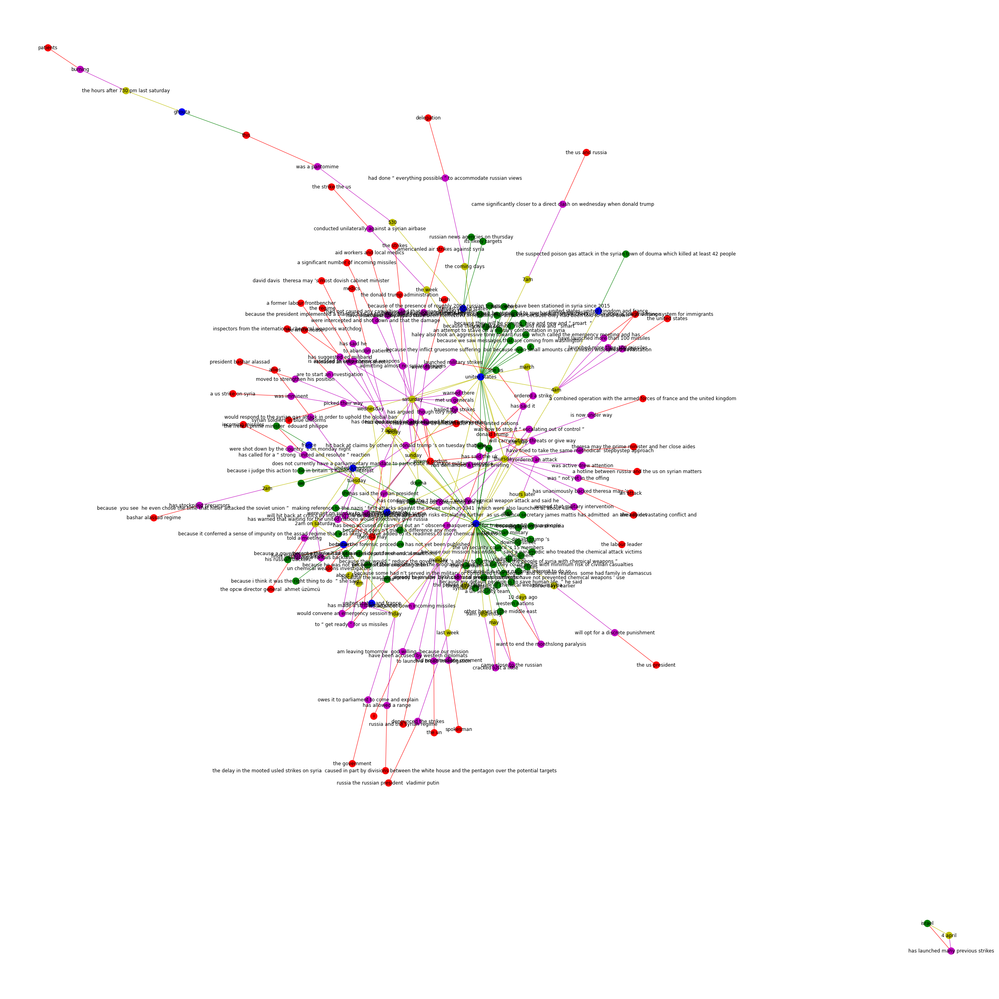

In [ ]:
# annotated flat version of chart 
# shell_layout
# spiral layout
g = nx.Graph()
for index, row in df_barc.iterrows():
  g.add_node(row['top_who_answer'], color="r")
  g.add_node(row['top_what_answer'], color="m")
  g.add_node(row['top_when_answer'], color="y")
  g.add_node(row['top_where_answer'], color="b")
  g.add_node(row['top_why_answer'], color="g")
  #g.add_node(row['top_how_answer'], color="c")
  g.add_edge(row['top_who_answer'], row['top_what_answer'], color='r')
  g.add_edge(row['top_what_answer'], row['top_when_answer'], color='m')
  g.add_edge(row['top_when_answer'], row['top_where_answer'], color='y')
  g.add_edge(row['top_where_answer'], row['top_why_answer'], color='g')
  #g.add_edge(row['top_why_answer'], row['top_how_answer'], color='b')

'''
color_map = []
for node in g:
    if node in df1["top_who_answer"]:
        color_map.append('blue')
    else: 
        color_map.append('green')      
#nx.draw(G, node_color=color_map, with_labels=True)
#plt.show()
'''
plt.figure(figsize=(35,35))

#print(edge_colors)
#print(node_colors)

pos = nx.spring_layout(g)
nx.draw(
    g,
    with_labels=True,
    edge_color=nx.get_edge_attributes(g, 'color').values(),
    node_color=nx.get_node_attributes(g, 'color').values(),
    pos = pos
  )
plt.show()

In [ ]:
# 3d Plot
g = nx.Graph()
for index, row in df_barc.iterrows():
  g.add_node(row['top_who_answer'], color=who_color, text=str(row['top_who_answer'] + "; " + row['pub_date_dto']))
  g.add_node(row['top_what_answer'], color=what_color, text=str(row['top_what_answer'] + "; " + row['pub_date_dto']))
  g.add_node(row['top_when_answer'], color=when_color, text=str(row['top_when_answer'] + "; " + row['pub_date_dto']))
  g.add_node(row['top_where_answer'], color=where_color, text=str(row['top_where_answer'] + "; " + row['pub_date_dto']))
  g.add_node(row['top_why_answer'], color=why_color, text=str(row['top_why_answer'] + "; " + row['pub_date_dto']))
  #g.add_node(row['top_how_answer'], color=how_color)
  g.add_edge(row['top_who_answer'], row['top_what_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_what_answer'], row['top_when_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_when_answer'], row['top_where_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_where_answer'], row['top_why_answer'])#, edge_color=row['unix_time_normalized'])
  #g.add_edge(row['top_why_answer'], row['top_how_answer'])#, edge_color=row['unix_time_normalized'])
g_positions = nx.spring_layout(g)

# print(g_positions)
print(g.edges())
edge_x = []
edge_y = []
edge_z = []
edge_color = []

for edge in g.edges():
    x0, y0 = g_positions[edge[0]]
    x1, y1 = g_positions[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)
    edge_z.append(0)
    edge_z.append(0)
    edge_z.append(None)
   # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


edge_trace = go.Scatter3d(
    x=edge_x,
    y=edge_y,
    z=edge_z,
    line=dict(
        width=0.5,
        # color=edge_color,
    ),
    hoverinfo='none',
    mode='lines',
)
# print(edge_color)
# edge_trace.marker.color = edge_color

# print(g.nodes())
node_x = []
node_y = []
node_z = []
node_colors = []
node_t = []
for node in g.nodes():
    # print(g_positions[node])
    x, y = g_positions[node]
    node_x.append(x)
    node_y.append(y)
    node_z.append(0)
    # node_t.append()

node_trace = go.Scatter3d(
    x=node_x,
    y=node_y,
    z=node_z,
    mode='markers',
    hoverinfo='text',
    marker=dict(
       showscale=False,
        reversescale=False,
        size=10,
        colorbar=dict(
            thickness=1,
            title='Node Connections',
            xanchor='left',
            titleside='right',
        ),
        line_width=2
    )
)


node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
# node_trace.text = [str(x) for x in g.nodes()]
node_trace.text = list(nx.get_node_attributes(g, 'text').values())
# node_trace.text = node_t

fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title='Full Narrative Chain Network',
        titlefont_size=16,
        showlegend=False,
        hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40),
        annotations=[dict(
             text="Full Network 3D",
            showarrow=False,
            xref="paper", 
            yref="paper",
            x=0.005,
            y=-0.002
        )],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
    )
fig.show()
#py.plot(fig,filename="network_full_3D",auto_open=False)

[('aid workers and local medics', 'have described apocalyptic scenes'), ('have described apocalyptic scenes', 'saturday'), ('saturday', 'douma'), ('saturday', 'warned there'), ('saturday', 'united states'), ('saturday', 'met us generals'), ('saturday', 'does not currently have a parliamentary mandate to participate in a major military response'), ('saturday', 'syria'), ('saturday', 'launched military strikes'), ('saturday', 'hailed the strikes'), ('saturday', 'were intercepted and shot down and that the damage'), ('saturday', 'had not caused any casualties and that syrian military facilities'), ('saturday', 'released an information sheet'), ('saturday', 'has described airstrikes and accused theresa may'), ('saturday', 'have sent an unequivocal message'), ('saturday', 'has questioned whether humanitarian intervention'), ('saturday', 'united kingdom'), ('saturday', 'picked their way'), ('saturday', 'has argued  though tory mps'), ('douma', 'because it does n’t make a difference any more 

### Analysis of Full Narrative Network





In [ ]:
# Define nodes_with_m_nbrs()
def nodes_with_m_nbrs(G, m):
    """
    Returns all nodes in graph G that have m neighbors.
    """
    nodes = set()

    # Iterate over all nodes in G
    for n in G.nodes():

        # Check if the number of neighbors of n matches m
        if len(list(G.neighbors(n))) == m:

            # Add the node n to the set
            nodes.add(n)

    # Return the nodes with m neighbors
    return nodes

# Compute and print all nodes in T that have 6 neighbors
six_nbrs = nodes_with_m_nbrs(g,5)
print(six_nbrs)

{'russia', 'douma'}


In [ ]:
# Compute the degree of every node: degrees
degrees = [len(list(g.neighbors(G))) for G in g.nodes()]

# Print the degrees
print(degrees)

[1, 2, 18, 5, 1, 1, 2, 2, 48, 1, 10, 2, 28, 2, 1, 2, 9, 1, 8, 2, 7, 7, 1, 1, 2, 1, 3, 2, 2, 2, 2, 5, 2, 1, 2, 2, 11, 2, 2, 2, 1, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 10, 2, 2, 2, 14, 1, 1, 2, 2, 1, 1, 2, 4, 1, 2, 15, 1, 2, 1, 1, 2, 1, 1, 2, 1, 2, 4, 1, 1, 2, 4, 1, 1, 2, 2, 2, 2, 7, 2, 2, 1, 1, 2, 1, 1, 2, 1, 2, 6, 2, 2, 3, 2, 1, 1, 2, 1, 1, 2, 6, 1, 2, 4, 1, 1, 2, 1, 2, 2, 4, 2, 1, 2, 2, 1, 2, 1, 1, 2, 1, 3, 2, 2, 1, 2, 2, 1, 2, 2, 1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1, 2, 2, 6, 2, 1, 2, 1, 2, 2, 1, 1, 2, 1, 2, 1, 2, 2, 1, 1, 2, 1, 2, 1, 2, 1, 1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 1, 2, 1, 2, 1, 2, 2, 2, 2]


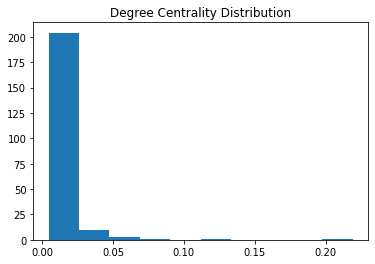

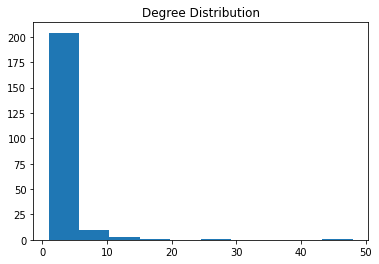

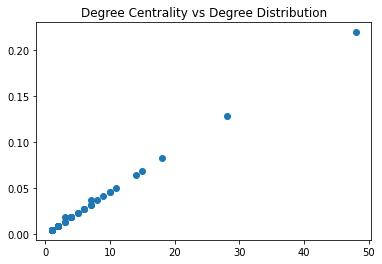

In [ ]:
# Compute the degree centrality of the Twitter network: deg_cent
deg_cent = nx.degree_centrality(g)

# Plot a histogram of the degree centrality distribution of the graph.
plt.figure()
plt.hist(list(deg_cent.values()))
plt.title("Degree Centrality Distribution")
plt.show()

# Plot a histogram of the degree distribution of the graph
plt.figure()
plt.hist(degrees)
plt.title("Degree Distribution")
plt.show()

# Plot a scatter plot of the centrality distribution and the degree distribution
plt.figure()
plt.scatter(degrees,list(deg_cent.values()))
plt.title("Degree Centrality vs Degree Distribution")
plt.show()

# Compute the betweenness centrality of G: bet_cen
bet_cen = nx.betweenness_centrality(g)

# Compute the degree centrality of G: deg_cen
deg_cen = nx.degree_centrality(g)

# Create a scatter plot of betweenness centrality and degree centrality
plt.scatter(list(bet_cen.values()), list(deg_cen.values()))
plt.title("Betweenness Centrality vs Degree Centrality")
# Display the plot
plt.show()

In [ ]:
# Define find_nodes_with_highest_deg_cent()
def find_nodes_with_highest_deg_cent(G):

    # Compute the degree centrality of G: deg_cent
    deg_cent = nx.degree_centrality(G)

    # Compute the maximum degree centrality: max_dc
    max_dc = max(list(deg_cent.values()))

    nodes = set()

    # Iterate over the degree centrality dictionary
    for k, v in deg_cent.items():

        # Check if the current value has the maximum degree centrality
        if v == max_dc:

            # Add the current node to the set of nodes
            nodes.add(k)

    return nodes

# Find the node(s) that has the highest degree centrality in T: top_dc
top_dc = find_nodes_with_highest_deg_cent(g)
print(top_dc)

# Write the assertion statement
for node in top_dc:
    assert nx.degree_centrality(g)[node] == max(nx.degree_centrality(g).values())

{'syria'}


In [ ]:
# Define find_node_with_highest_bet_cent()
def find_node_with_highest_bet_cent(G):

    # Compute betweenness centrality: bet_cent
    bet_cent = nx.betweenness_centrality(G)

    # Compute maximum betweenness centrality: max_bc
    max_bc = max(list(bet_cent.values()))

    nodes = set()

    # Iterate over the betweenness centrality dictionary
    for k, v in bet_cent.items():

        # Check if the current value has the maximum betweenness centrality
        if v == max_bc:

            # Add the current node to the set of nodes
            nodes.add(k)

    return nodes
  
  # Use that function to find the node(s) that has the highest betweenness centrality in the network: top_bc
top_bc = find_node_with_highest_bet_cent(g)
print(top_bc)

# Write an assertion statement that checks that the node(s) is/are correctly identified.
for node in top_bc:
    assert nx.betweenness_centrality(g)[node] == max(nx.betweenness_centrality(g).values())

{'syria'}


### Day by Day 3D graph 

In [ ]:
def make_every_day_between_min_and_max(input_df, pub_date_col):
  every_publication_date = input_df[pub_date_col].unique().tolist()
  every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
  print(every_publication_date)
  min_pub_date_dto = min(every_publication_date_dto)
  max_pub_date_dto = max(every_publication_date_dto)

  day_delta = max_pub_date_dto - min_pub_date_dto
  ret = []
  for i in range(day_delta.days + 1):
    day = min_pub_date_dto + dt.timedelta(days=i)
    day_str = day.strftime("%Y-%m-%d")
    ret.append(day_str)

  return ret

print(make_every_day_between_min_and_max(df_barc, 'pub_date_dto'))

['2018-04-08', '2018-04-09', '2018-04-10', '2018-04-11', '2018-04-12', '2018-04-13', '2018-04-14', '2018-04-15', '2018-04-16', '2018-04-17', '2018-04-18', '2018-04-20', '2018-04-24', '2018-04-26']
['2018-04-08', '2018-04-09', '2018-04-10', '2018-04-11', '2018-04-12', '2018-04-13', '2018-04-14', '2018-04-15', '2018-04-16', '2018-04-17', '2018-04-18', '2018-04-19', '2018-04-20', '2018-04-21', '2018-04-22', '2018-04-23', '2018-04-24', '2018-04-25', '2018-04-26']


In [ ]:
g = nx.Graph()


every_date_between_list = make_every_day_between_min_and_max(df_barc, 'pub_date_dto')

for index, row in df_barc.iterrows():
  depth=every_date_between_list.index(row['pub_date_dto'])
  g.add_node((row['top_who_answer'], depth), color= who_color, depth=depth) 
  g.add_node((row['top_what_answer'], depth), color=what_color, depth=depth) 
  g.add_node((row['top_when_answer'], depth), color= when_color, depth=depth) 
  g.add_node((row['top_where_answer'], depth), color=where_color, depth=depth) 
  g.add_node((row['top_why_answer'], depth), color= why_color, depth=depth) 
  g.add_node((row['top_how_answer'], depth), color= how_color, depth=depth) 
  g.add_edge((row['top_who_answer'], depth), (row['top_what_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
  g.add_edge((row['top_what_answer'], depth), (row['top_when_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
  g.add_edge((row['top_when_answer'], depth), (row['top_where_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
  g.add_edge((row['top_where_answer'], depth), (row['top_why_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
  g.add_edge((row['top_why_answer'], depth), (row['top_how_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
g_positions = nx.spiral_layout(g)

# print(g_positions)
# print(g.edges())
edge_x = []
edge_y = []
edge_z = []
edge_color = []
for edge in g.edges():
    x0, y0 = g_positions[edge[0]]
    x1, y1 = g_positions[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)
    edge_z.append(g.edges[edge]['depth'])
    edge_z.append(g.edges[edge]['depth'])
    edge_z.append(None)
   # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


edge_trace = go.Scatter3d(
    x=edge_x,
    y=edge_y,
    z=edge_z,
    line=dict(
        width=0.5,
        # color=edge_color,
    ),
    hoverinfo='none',
    mode='lines',
)
# print(edge_color)
# edge_trace.marker.color = edge_color

# print(g.nodes())
node_x = []
node_y = []
node_z = []
node_colors = []
node_texts = []
for node in g.nodes():
    # print(g_positions[node])
    x, y = g_positions[node]
    node_x.append(x)
    node_y.append(y)
    node_z.append(g.nodes[node]['depth'])

node_trace = go.Scatter3d(
    x=node_x,
    y=node_y,
    z=node_z,
    mode='markers',
    hoverinfo='text',
    marker=dict(
       showscale=False,
        reversescale=False,
        size=10,
        colorbar=dict(
            thickness=1,
            title='Node Connections',
            xanchor='left',
            titleside='right',
        ),
        line_width=2
    )
)


node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
node_trace.text = [str(x) for x in g.nodes()]

fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title='<br>Network of Articles Day by Day',
        titlefont_size=16,
        showlegend=False,
        hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40),
        annotations=[dict(
            text="Day by Day Network 3D",
            showarrow=False,
            xref="paper", 
            yref="paper",
            x=0.005,
            y=-0.002
        )],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
    )

fig.show()
#py.plot(fig,filename="network_full_daily",auto_open=False)

['2018-04-08', '2018-04-09', '2018-04-10', '2018-04-11', '2018-04-12', '2018-04-13', '2018-04-14', '2018-04-15', '2018-04-16', '2018-04-17', '2018-04-18', '2018-04-20', '2018-04-24', '2018-04-26']


# Named Entity Recognition (NER) Analysis

## NER mentions over course of narrative chain using Gantt Chart 

### Evolution of Top People NERS

In [ ]:
# gantt= df1.sort_values(by='pub_date_dto').groupby('v_hier_infomap_comm').agg({'pub_date_dto': max, 'pub_date_dto':min})



def gantt_NER(df,num):
  gantt_df = pd.DataFrame(columns=["Begin", "End"])
  # print(df1.head(1))
  for entity_name in df['entity'].unique().tolist():
    entity_df = df[df["entity"] == entity_name]
    entity_count=len(entity_df)

    every_publication_date = entity_df["pub_date_dto"].unique().tolist()
    every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
    # print(every_publication_date)
    # if len(every_publication_date) < 2:
    #   continue
    min_pub_date_dto = min(every_publication_date_dto)
    max_pub_date_dto = max(every_publication_date_dto)
    # Push the max day up by 1, to include that day.
    max_pub_date_dto = max_pub_date_dto + dt.timedelta(days=1)

    entity_dict = {
        'Entity_Name': entity_name,
        'Begin': min_pub_date_dto.strftime("%Y-%m-%d"),
        'End': max_pub_date_dto.strftime("%Y-%m-%d"),
        'entity_count': entity_count
    }
    # print(cluster_dict)
    gantt_df = gantt_df.append(entity_dict, ignore_index=True)



  gantt_df["enity_count"] = gantt_df["entity_count"].astype(int)

  gantt_df=gantt_df[gantt_df["entity_count"]>=num]
  return gantt_df

df_people= new_df[new_df["entity_type"]=="PERSON"]
gantt_df_new=gantt_NER(df_people,15)

In [ ]:
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for People", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_people",auto_open=False)

### Evolution of Top Organization NER Mentions 

---



In [ ]:

df_org= new_df[new_df["entity_type"]=="ORG"]

gantt_df_new=gantt_NER(df_org,15)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for Organizations", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_ORG",auto_open=False)


### Evolution of Top NORP NER Mentions 

In [ ]:
# gantt= df1.sort_values(by='pub_date_dto').groupby('v_hier_infomap_comm').agg({'pub_date_dto': max, 'pub_date_dto':min})


df_NORP= new_df[new_df["entity_type"]=="NORP"]

gantt_df_new=gantt_NER(df_NORP,6)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for NORP", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_NORP",auto_open=False)



### Evolution of Top GPE NER Mentions 

In [ ]:
df_GPE= new_df[new_df["entity_type"]=="GPE"]

gantt_df_new=gantt_NER(df_GPE,50)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for GPE", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_GPE",auto_open=False)




### Evolution of Top NER EVENT Mentions 

In [ ]:
df_EVENT= new_df[new_df["entity_type"]=="EVENT"]


gantt_df_new=gantt_NER(df_EVENT,1)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for Event", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
#fig.show()
#py.plot(fig,filename="NER_EVENT",auto_open=False)

### Evolution of Top NER Location Mentions 

In [ ]:
df_LOC= new_df[new_df["entity_type"]=="LOC"]


gantt_df_new=gantt_NER(df_LOC,1)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for Locations", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_LOC",auto_open=False)

# Network Evolution of NERs 

In [ ]:
def make_figure(g):
    g_positions = nx.spring_layout(g)

    edge_x = []
    edge_y = []
    for edge in g.edges():
        x0, y0 = g_positions[edge[0]]
        x1, y1 = g_positions[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x,
        y=edge_y,
        line=dict(
            width=0.5,
        ),
        hoverinfo='none',
        mode='lines',
    )

    node_x = []
    node_y = []
    node_texts = []

    for node_name in g.nodes():
        # print(g_positions[node])
        x, y = g_positions[node_name]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x,
        y=node_y,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            reversescale=True,
            colorbar=dict(
                thickness=1,
                title='Node Connections',
                xanchor='left',
                titleside='right',
            ),
            line_width=2
        )
    )

    print(edge_trace)
    print(node_trace)

    fig = go.Figure(
        data=[edge_trace, node_trace],
        layout=go.Layout(
            #title='<br>Network graph made with Python',
            #titlefont_size=16,
            showlegend=False,
            hovermode='closest',
            margin=dict(b=20,l=5,r=5,t=40),
            annotations=[dict(
                showarrow=False,
                xref="paper", 
                yref="paper",
                x=0.005,
                y=-0.002
            )],
            xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
        )
    return fig

In [ ]:
def make_figure_1(g):
  g_positions = nx.spring_layout(g)

  # print(g_positions)
  # print(g.edges())
  edge_x = []
  edge_y = []
  edge_color = []
  for edge in g.edges():
      x0, y0 = g_positions[edge[0]]
      x1, y1 = g_positions[edge[1]]
      edge_x.append(x0)
      edge_x.append(x1)
      edge_x.append(None)
      edge_y.append(y0)
      edge_y.append(y1)
      edge_y.append(None)
    # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


  edge_trace = go.Scatter(
      x=edge_x,
      y=edge_y,
      line=dict(
          width=0.5,
          # color=edge_color,
      ),
      hoverinfo='none',
      mode='lines',
  )
  # print(edge_color)
  # edge_trace.marker.color = edge_color

  # print(g.nodes())
  node_x = []
  node_y = []
  node_colors = []
  node_texts = []
  for node in g.nodes():
      # print(g_positions[node])
      x, y = g_positions[node]
      node_x.append(x)
      node_y.append(y)

  node_trace = go.Scatter(
      x=node_x,
      y=node_y,
      mode='markers',
      hoverinfo='text',
      marker=dict(
        showscale=False,
          reversescale=False,
          size=10,
          colorbar=dict(
              thickness=1,
              title='Node Connections',
              xanchor='left',
              titleside='right',
          ),
          line_width=2
      )
  )


  node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
  node_trace.text = [str(x) for x in g.nodes()]

  fig = go.Figure(
      data=[edge_trace, node_trace],
      layout=go.Layout(
          title='<br>Network graph made with Python',
          titlefont_size=16,
          showlegend=False,
          hovermode='closest',
          margin=dict(b=20,l=5,r=5,t=40),
          annotations=[dict(
              showarrow=False,
              xref="paper", 
              yref="paper",
              x=0.005,
              y=-0.002
          )],
          xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
          yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
      )

  return fig

In [ ]:


print("size of df_people['entity']", len(df_people['entity']))
print("size of df_org['entity']", len(df_org['entity']))
Gs = [] 
for day in make_every_day_between_min_and_max(new_df, 'pub_date_dto'):
    # print(day)
    # Instantiate a new undirected graph: G
    G = nx.Graph()
    
    # Add in all nodes that have ever shown up to the graph
    G.add_nodes_from(df_people['entity'])
    G.add_nodes_from(df_org['entity'])
    G.add_nodes_from(df_NORP['entity'])
    G.add_nodes_from(df_GPE['entity'])
    
    # Filter the DataFrame so that there's only the given month
    df_filtered = new_df[new_df['pub_date_dto'] == day]

    edges = []
    every_entity_today = df_filtered[df_filtered["entity_type"].isin(['NORP','PERSON', "GPE", "ORG"])]
    every_entity_today = every_entity_today["entity"]

    for lidx, left in enumerate(every_entity_today):
      if lidx+1 == len(every_entity_today):
        break
      for ridx, right in enumerate(every_entity_today[lidx+1:]):
        edges.append((left, right))
    print("All the edges:", edges)

    if len(edges) < 1:
      continue
    
    # Add edges from filtered DataFrame
    G.add_edges_from(edges) 

    # Clip out every node with less than 1 connecting edge.
    G_reduced = G.copy()
    removed_nodes = [node for node,degree in dict(G_reduced.degree()).items() if degree < 1]
    G_reduced.remove_nodes_from(removed_nodes)

    fig = make_figure_1(G_reduced)
    fig.show()
    
    # Append G to the list of graphs
    Gs.append(G)

size of df_people['entity'] 942
size of df_org['entity'] 899
['2018-04-08', '2018-04-09', '2018-04-10', '2018-04-11', '2018-04-12', '2018-04-13', '2018-04-14', '2018-04-15', '2018-04-16', '2018-04-17', '2018-04-18', '2018-04-20', '2018-04-24', '2018-04-26']
All the edges: [('Douma', 'Syria'), ('Douma', 'Bashar al-Assad'), ('Douma', 'Khan Sheikhun'), ('Douma', 'US'), ('Douma', 'Syrian'), ('Douma', 'Ghouta'), ('Douma', 'Damascus'), ('Douma', 'Syrian'), ('Douma', 'Douma'), ('Douma', 'Douma'), ('Douma', 'Ghouta'), ('Douma', 'Assad’s'), ('Douma', 'Moscow'), ('Douma', 'Damascus'), ('Douma', 'UN'), ('Douma', 'Ghouta'), ('Douma', 'Syria'), ('Douma', 'Donald Trump’s'), ('Douma', 'Bashar al-Assad’s'), ('Douma', 'Douma'), ('Douma', 'Trump’s'), ('Douma', 'Vladimir Putin'), ('Douma', 'Russian'), ('Douma', 'Assad'), ('Douma', 'US'), ('Douma', 'Syria'), ('Douma', 'Assad’s'), ('Douma', 'Dumayr'), ('Douma', 'Syrian'), ('Douma', 'US'), ('Douma', 'Syria'), ('Douma', 'France'), ('Douma', 'Israel'), ('Doum

All the edges: [('Israeli', 'Syrian'), ('Israeli', 'Homs'), ('Israeli', 'Russian'), ('Israeli', 'Syrian'), ('Israeli', 'Russian'), ('Israeli', 'Israeli'), ('Israeli', 'Lebanese'), ('Israeli', 'Syrian'), ('Israeli', 'Russian'), ('Israeli', 'Israeli'), ('Israeli', 'Syrian'), ('Israeli', 'Homs'), ('Israeli', 'American'), ('Israeli', 'Pentagon'), ('Israeli', 'Lebanon'), ('Israeli', 'Syria'), ('Israeli', 'Iranians'), ('Israeli', 'Iran'), ('Israeli', 'UK'), ('Israeli', 'Syrian Observatory'), ('Israeli', 'Iranian'), ('Israeli', 'Iranian'), ('Israeli', 'Tiyas'), ('Israeli', 'Homs'), ('Israeli', 'Palmyra'), ('Israeli', 'Russian'), ('Israeli', 'Russian'), ('Israeli', 'Iranian'), ('Israeli', 'Israel'), ('Israeli', 'Syria'), ('Israeli', 'US'), ('Israeli', 'Iranian'), ('Israeli', 'Israel'), ('Israeli', 'Israeli'), ('Israeli', 'Iranian'), ('Israeli', 'Hezbollah'), ('Israeli', 'Lebanon'), ('Israeli', 'Israel'), ('Israeli', 'Donald Trump’s'), ('Israeli', 'US'), ('Israeli', 'Syria'), ('Israeli', 'Israe

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



All the edges: [('Jeremy Corbyn', 'UK'), ('Jeremy Corbyn', 'US'), ('Jeremy Corbyn', 'Syrian'), ('Jeremy Corbyn', 'Bashar al-Assad’s'), ('Jeremy Corbyn', 'Douma'), ('Jeremy Corbyn', 'UK'), ('Jeremy Corbyn', 'United Nations'), ('Jeremy Corbyn', 'Russia'), ('Jeremy Corbyn', 'UN'), ('Jeremy Corbyn', 'Corbyn'), ('Jeremy Corbyn', 'Diane Abbott'), ('Jeremy Corbyn', 'the Labour party'), ('Jeremy Corbyn', 'Syrian'), ('Jeremy Corbyn', 'Corbyn'), ('Jeremy Corbyn', 'Theresa'), ('Jeremy Corbyn', 'Syria'), ('Jeremy Corbyn', 'British'), ('Jeremy Corbyn', 'Donald Trump'), ('Jeremy Corbyn', 'Syria'), ('Jeremy Corbyn', 'US'), ('Jeremy Corbyn', 'James Mattis'), ('Jeremy Corbyn', 'Washington'), ('Jeremy Corbyn', 'Corbyn'), ('Jeremy Corbyn', 'Donald Trump'), ('Jeremy Corbyn', 'US'), ('Jeremy Corbyn', 'Britain'), ('Jeremy Corbyn', 'UN'), ('Jeremy Corbyn', 'UN'), ('Jeremy Corbyn', 'Syrian'), ('Jeremy Corbyn', 'BBC Radio 4’s Today'), ('Jeremy Corbyn', 'Abbott'), ('Jeremy Corbyn', 'UN'), ('Jeremy Corbyn', 'Syr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



All the edges: [('Jeremy Corbyn', 'UK'), ('Jeremy Corbyn', 'BBC One’s'), ('Jeremy Corbyn', 'Andrew Marr Show'), ('Jeremy Corbyn', 'UK'), ('Jeremy Corbyn', 'US'), ('Jeremy Corbyn', 'France'), ('Jeremy Corbyn', 'Corbyn'), ('Jeremy Corbyn', 'the Stop the War Coalition'), ('Jeremy Corbyn', 'UN'), ('Jeremy Corbyn', 'Humanitarian'), ('Jeremy Corbyn', 'Corbyn'), ('Jeremy Corbyn', 'Boris Johnson'), ('Jeremy Corbyn', 'Corbyn'), ('Jeremy Corbyn', 'Assad'), ('Jeremy Corbyn', 'Syria'), ('Jeremy Corbyn', 'Johnson'), ('Jeremy Corbyn', 'Syria'), ('Jeremy Corbyn', 'Russians'), ('Jeremy Corbyn', 'Geneva'), ('Jeremy Corbyn', 'Washington'), ('Jeremy Corbyn', 'Trump'), ('Jeremy Corbyn', 'Assad'), ('Jeremy Corbyn', 'Johnson'), ('Jeremy Corbyn', 'UK'), ('Jeremy Corbyn', 'Johnson'), ('Jeremy Corbyn', 'Corbyn'), ('Jeremy Corbyn', 'Russian'), ('Jeremy Corbyn', 'Salisbury'), ('Jeremy Corbyn', 'Russian'), ('Jeremy Corbyn', 'Britain'), ('Jeremy Corbyn', 'Johnson'), ('Jeremy Corbyn', 'UK'), ('Jeremy Corbyn', 'East

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
# Instantiate a list of graphs that show edges added
added = []
# Instantiate a list of graphs that show edges removed 
removed = []
# Here's the fractional change over time
fractional_changes = []
window = 1  
i = 0      

for i in range(len(Gs) - window):
    g1 = Gs[i]
    g2 = Gs[i + window]
        
    # Compute graph difference 
    added.append(nx.difference(g2, g1))   
    removed.append(nx.difference(g1, g2))
    
    # Compute change in graph size over time
    fractional_changes.append((len(g2.edges()) - len(g1.edges())) / len(g1.edges()))
    
# Print the fractional change
print(fractional_changes)


[1.9770713913496614, 0.6628741466830037, -0.6214736842105263, 4.119299221357063, -0.475799880493237, 2.2380310880829017, -0.673408647230134, -0.5770700636942675, -0.6881371640407785, 0.33060921248142644, -0.7504187604690117, -0.2550335570469799, 0.34234234234234234]


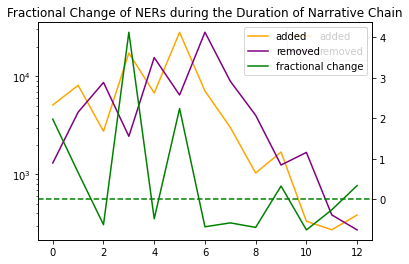

In [ ]:


fig = plt.figure()
ax1 = fig.add_subplot(111)

# Plot the number of edges added over time
edges_added = [len(g.edges()) for g in added]
plot1 = ax1.plot(edges_added, label='added', color='orange')

# Plot the number of edges removed over time
edges_removed = [len(g.edges()) for g in removed]
plot2 = ax1.plot(edges_removed, label='removed', color='purple')

# Set yscale to logarithmic scale
ax1.set_yscale('log')  
ax1.legend()

# 2nd axes shares x-axis with 1st axes object
ax2 = ax1.twinx()

# Plot the fractional changes over time
plot3 = ax2.plot(fractional_changes, label='fractional change', color='green')

# Here, we create a single legend for both plots
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc=0)
plt.axhline(0, color='green', linestyle='--')
plt.title("Fractional Change of NERs during the Duration of Narrative Chain")
plt.show()

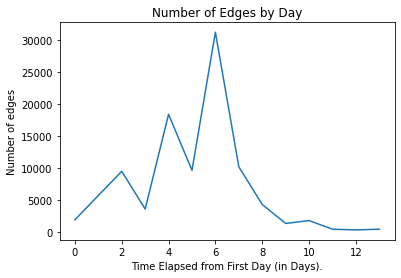

In [ ]:
# Import matplotlib


fig = plt.figure()

# Create a list of the number of edges per day
edge_sizes = [len(g.edges()) for g in Gs]
#print(edge_sizes)
# Plot edge sizes over time
plt.plot(edge_sizes)
plt.xlabel('Time Elapsed from First Day (in Days).') 
plt.ylabel('Number of edges')     
plt.title("Number of Edges by Day")                      
plt.show() 
